# Bayesian Calibration Using The Same Calfile as Alan

In this notebook, we focus on pure calibration, using the same data as used by Alan to process the NP results.
The idea is to look at the posteriors and evidence for different numbers of terms to decide the "best" number
of terms to use. This will be the choice used for the simultaneous sky/calibration runs, where we don't want
the sky itself to influence the choice of number of calibration terms.

Note that we look at the standard calibration, and try to match to Alan's calibration in `getting_2015_calibration.ipynb`, instead of here. Also note that there is another version of this notebook in the repo about comparing to the Nature Paper data. We leave that separate because its output is meant to be static with that analysis.

## Setup

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from scipy import stats


import glob

from edges_cal import modelling as mdl
from edges_cal.tools import bin_array
from edges_analysis.analysis import s11 as s11m
from yabf import load_likelihood_from_yaml
from yabf.core.samplers import run_map

import arviz as az
from getdist import plots
from getdist import loadMCSamples
from getdist import MCSamples, ParamNames

import alan_data_utils as utils
import mcmc_utils
import run_alan_cal_mcmc as cal_mcmc
import notebook_utils as nutl

plt.ion()
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
nutl.setup_mpl()
nutl.print_versions()

Numpy Version:  1.21.2
Astropy Version:  5.0
read_acq Version:  0.4.6.dev14+gd72e4fb.d20220207
edges-io Version:  4.0.0
edges-cal Version:  6.0.0
edges-analysis Version:  4.0.0


## Read The MCMC Runs

In [3]:
runs = cal_mcmc.get_completed_cal_runs(read=True)

In [4]:
for key in runs:
    print(key)

c06_w05_smooth16_tns0500_ign[('open',)]
c06_w05_smooth16_tns0500_ign[()]
c06_w06_smooth16_tns0500_ign[('open',)]
c06_w07_smooth16_tns0500_ign[('open',)]
c06_w07_smooth16_tns0500_ign[()]
c06_w08_smooth16_tns0500_ign[()]
c06_w09_smooth16_tns0500_ign[()]
c06_w10_smooth16_tns0500_ign[()]
c06_w11_smooth16_tns0500_ign[()]


In [5]:
blobs = {}
for name, mcsample in runs.items():
    blobs[name] = cal_mcmc.get_all_cal_curves(mcsample, nthreads=16)

### Compare Evidence

In [18]:
for name, run in runs.items():
    print(f"{name}: ", mcmc_utils.get_evidence(run.root))

c06_w05_smooth16_tns0500_ign[('open',)]:  3813.81634309264
c06_w05_smooth16_tns0500_ign[()]:  3517.01661662592
c06_w06_smooth16_tns0500_ign[('open',)]:  3825.32820136044
c06_w07_smooth16_tns0500_ign[('open',)]:  3842.45843562772
c06_w07_smooth16_tns0500_ign[()]:  4761.84961914335
c06_w08_smooth16_tns0500_ign[()]:  4959.99314860977
c06_w09_smooth16_tns0500_ign[()]:  4966.96714556079
c06_w10_smooth16_tns0500_ign[()]:  4967.17909551976
c06_w11_smooth16_tns0500_ign[()]:  5055.26771523192


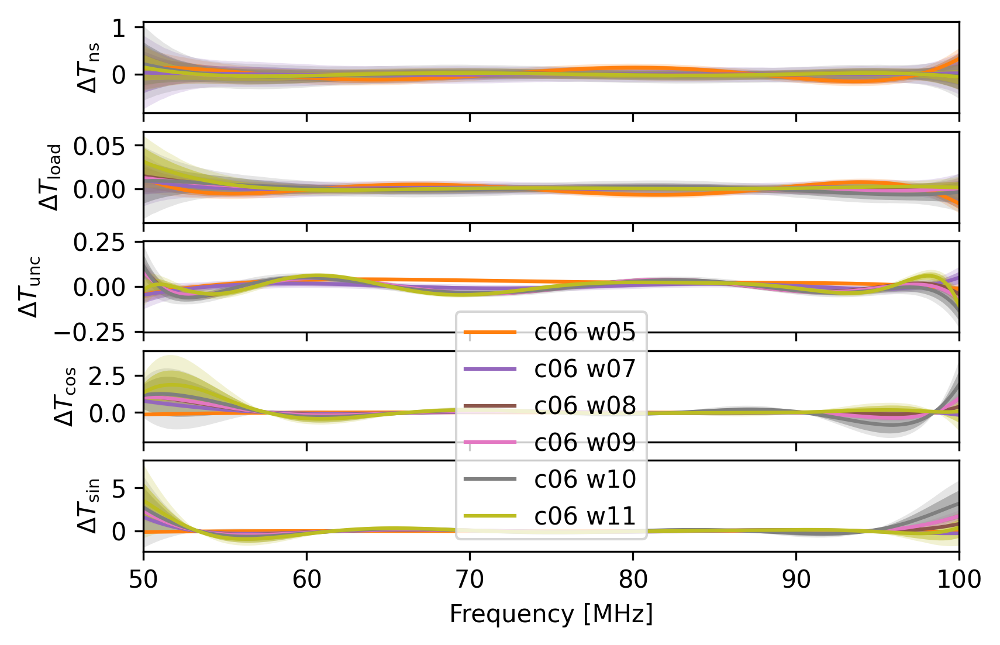

In [19]:
fig, ax = None, None
for i, (name, run) in enumerate(runs.items()):
    if 'open' not in name:
        fig, ax = utils.plot_cal_solutions(blobs[name], utils.calobs, label=' '.join(name.split('_')[:2]), fig=fig, ax=ax, cidx=i)
plt.legend();

Note that in the above plot, the temperature difference is between the MCMC estimate and the "best fit" in `calobs` using the old iterative solution. We expect small differences even for the default run due to different weighting between these approaches. 

In [6]:
src_best_temps = {}
for name, bl in blobs.items():
    src_best_temps[name] = cal_mcmc.get_recalibrated_src_temp_best(bl, runs[name].root, utils.calobs)

In [7]:
standard_best_temps = {name: tmp for name, tmp in src_best_temps.items() if 'open' not in name}

In [8]:
def evidence_labeller(name):
    short = ' '.join(name.split('_')[:2])
    evidence = utils.get_evidence(runs[name].root)
    
    kwargs = cal_mcmc.get_kwargs(name)
    lk = cal_mcmc.get_likelihood(**kwargs)
    
    k = lk.nw_model.c_terms*2 + 3*lk.nw_model.w_terms
    
    # add loglike because in getdist it's actually -loglike
    bic = k * np.log(len(lk.partial_linear_model.data['q'])) + 2*runs[name].loglikes.max()
    
    return f"{short} lnZ={evidence:.1f} BIC={bic:.1f}"

In [9]:
likelihoods = {}
for name in runs:
    kwargs = cal_mcmc.get_kwargs(name)
    likelihoods[name] = cal_mcmc.get_likelihood(**kwargs)

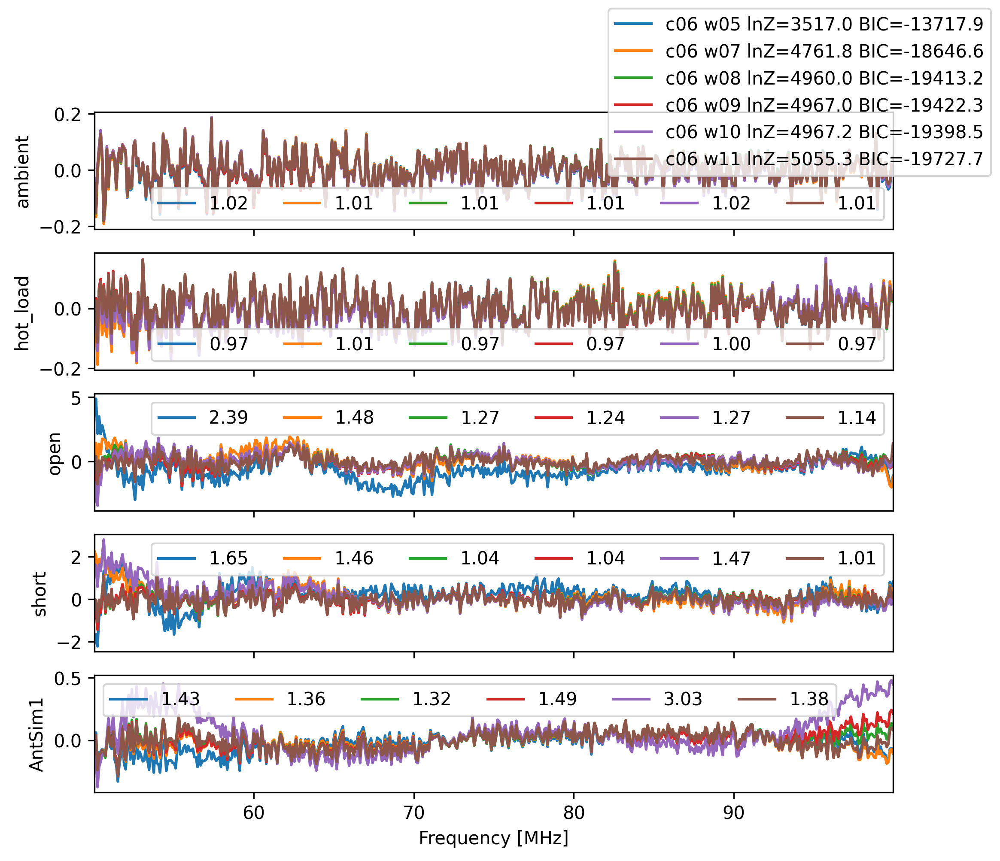

In [10]:
fig, ax = utils.plot_multi_recalibrated_sources(standard_best_temps, likelihoods,  utils.calobs, fills=False, with_rms=True, labeller=evidence_labeller)

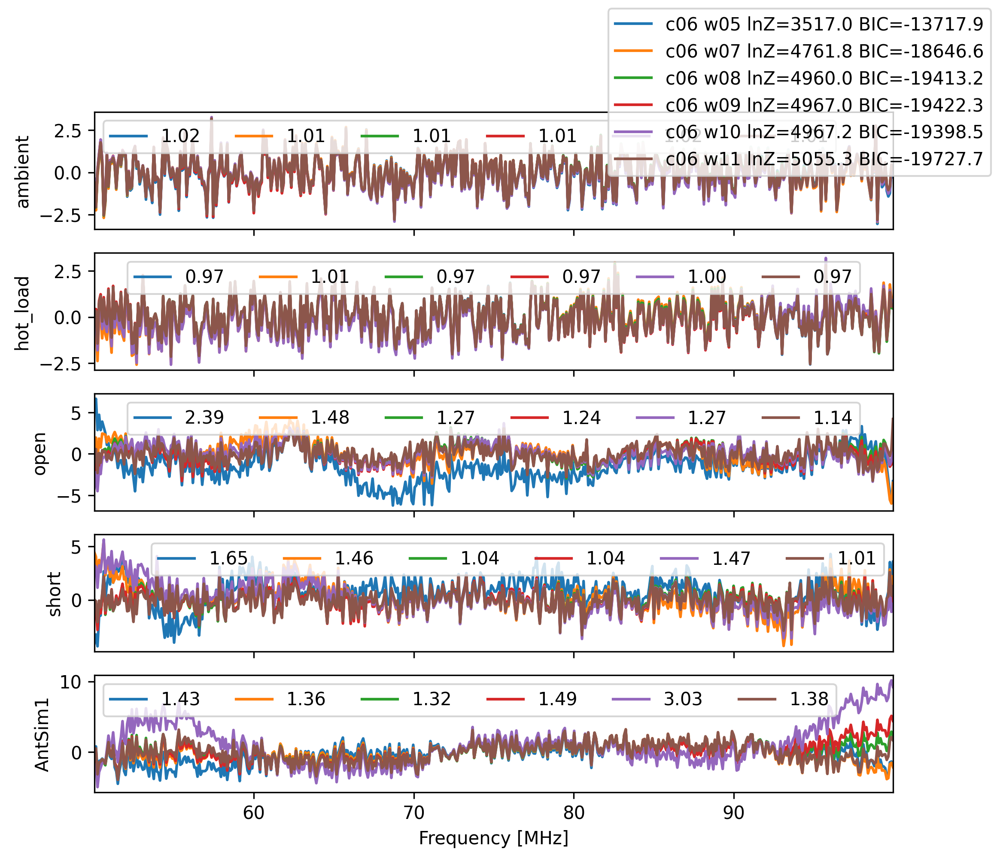

In [11]:
fig, ax = utils.plot_multi_recalibrated_sources(standard_best_temps, likelihoods,  utils.calobs, fills=False, with_rms=True, labeller=evidence_labeller, std_units=True)

So, both ambient and hot load are getting fit down to the noise, and even `short` is close for a high number of wterms. But `open` is not great -- its RMS is greater than 1.14, which is significantly more than noise, and by eye is clearly rippling with a period of ~10 MHz. This is causing the solution to prefer high orders. The question is how well can we constrain the source of this error?

## Look at S11 as Possible Source of Bad Modelling

In [ ]:
from edges_cal import receiver_calibration_func as rcf

In [63]:
freq = np.fft.fftshift(np.fft.fftfreq(utils.calobs.freq.n, d=utils.calobs.freq.df))

In [52]:
K = utils.calobs.get_K()

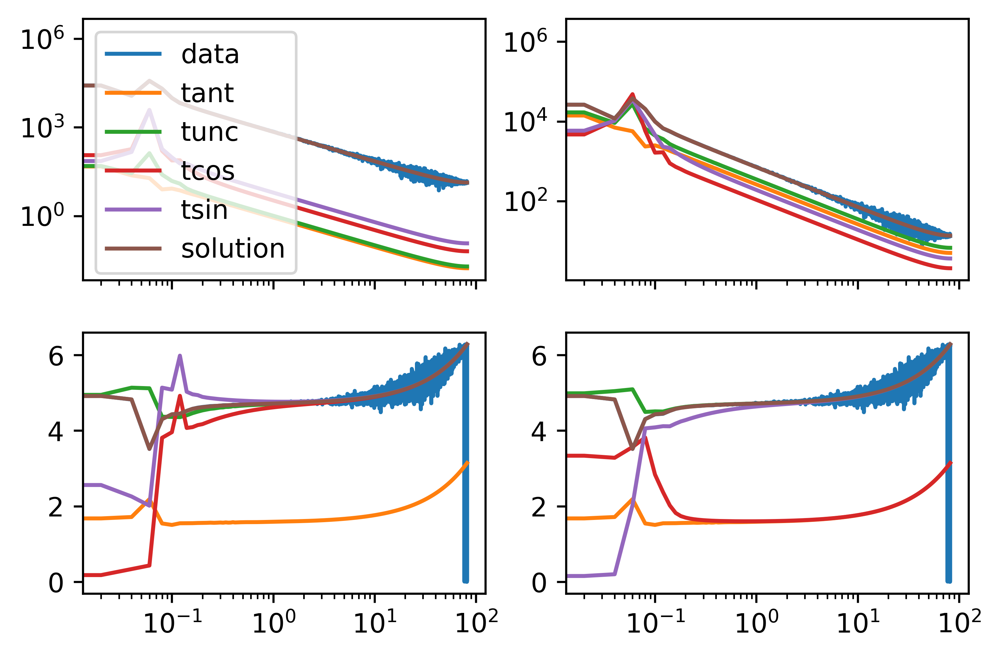

In [79]:
fig, ax = plt.subplots(2, 2, sharex=True)

ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(utils.calobs.open.spectrum.averaged_spectrum))), label='data')
ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][0]))), label='tant')
ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][1]))), label='tunc')
ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][2]))), label='tcos')
ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][3]))), label='tsin')
ax[0, 0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(utils.calobs.decalibrate(utils.calobs.open.spectrum.temp_ave, 'open')))), label='solution')

ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(utils.calobs.open.spectrum.averaged_spectrum))), label='data')
ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][0] * utils.calobs.open.spectrum.temp_ave))), label='tant')
ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][1] * utils.calobs.Tunc()))), label='tunc')
ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][2] * utils.calobs.Tcos()))), label='tcos')
ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(K['open'][3] * utils.calobs.Tsin()))), label='tsin')
ax[0, 1].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(utils.calobs.decalibrate(utils.calobs.open.spectrum.temp_ave, 'open')))), label='solution')



ax[0, 0].set_yscale('log')
ax[0, 0].set_xscale('log')
ax[0, 1].set_yscale('log')
ax[0, 1].set_xscale('log')
ax[0, 0].legend()


ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(utils.calobs.open.spectrum.averaged_spectrum))))%(2*np.pi))
ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][0]))))%(2*np.pi))
ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][1]))))%(2*np.pi))
ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][2]))))%(2*np.pi))
ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][3]))))%(2*np.pi))
ax[1, 0].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(utils.calobs.decalibrate(utils.calobs.open.spectrum.temp_ave, 'open')))))%(2*np.pi))

ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(utils.calobs.open.spectrum.averaged_spectrum))))%(2*np.pi))
ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][0] * utils.calobs.open.spectrum.temp_ave))))%(2*np.pi))
ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][1] * utils.calobs.Tunc()))))%(2*np.pi))
ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][2] * utils.calobs.Tcos()))))%(2*np.pi))
ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(K['open'][3] * utils.calobs.Tsin()))))%(2*np.pi))
ax[1, 1].plot(freq, np.unwrap(np.angle(np.fft.fftshift(np.fft.fft(utils.calobs.decalibrate(utils.calobs.open.spectrum.temp_ave, 'open')))))%(2*np.pi))


#ax[1].yscale('log')
ax[1, 0].set_xscale('log')
ax[1, 1].set_xscale('log')

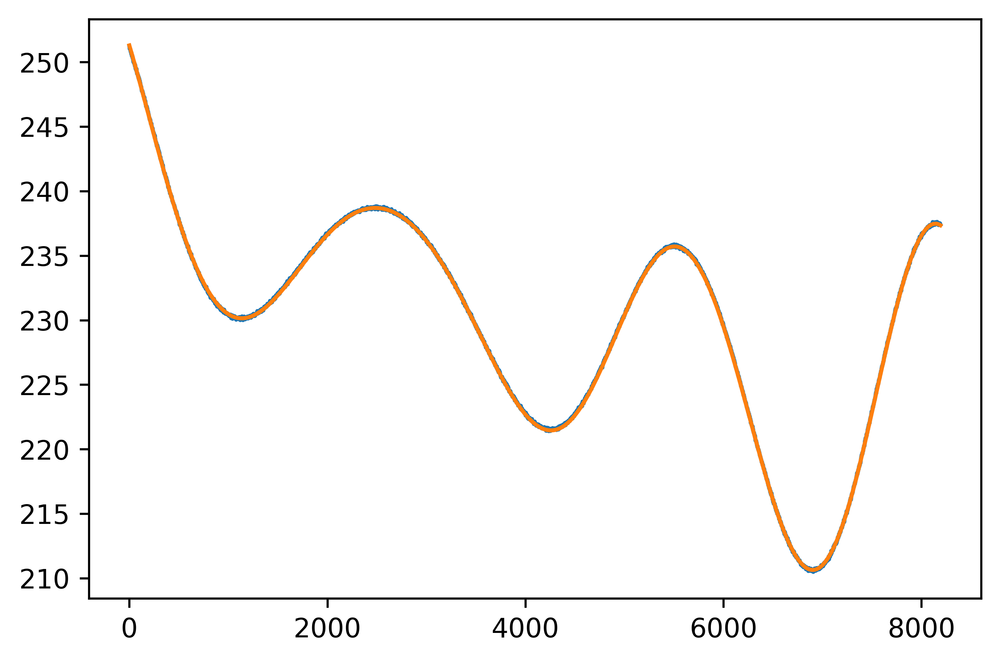

In [99]:
plt.plot(utils.calobs.short.spectrum.averaged_spectrum)
plt.plot(utils.calobs.decalibrate(utils.calobs.short.spectrum.temp_ave, 'short'))

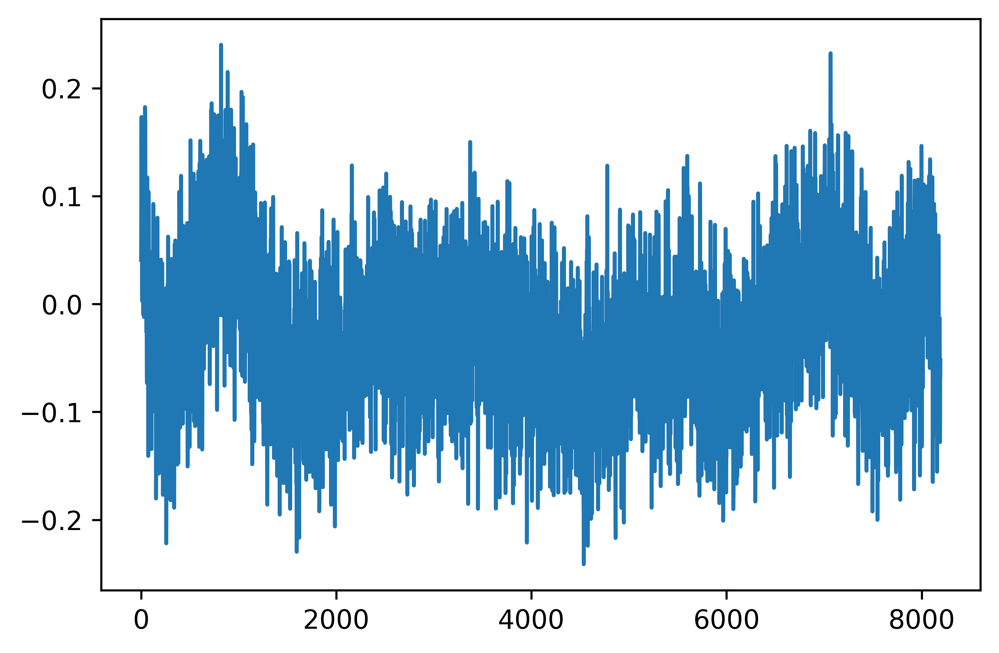

In [97]:
plt.plot(resid)

{'ambient': <Figure size 3600x2400 with 4 Axes>,
 'hot_load': <Figure size 3600x2400 with 4 Axes>,
 'open': <Figure size 3600x2400 with 4 Axes>,
 'short': <Figure size 3600x2400 with 4 Axes>,
 'lna': <Figure size 3600x2400 with 4 Axes>}

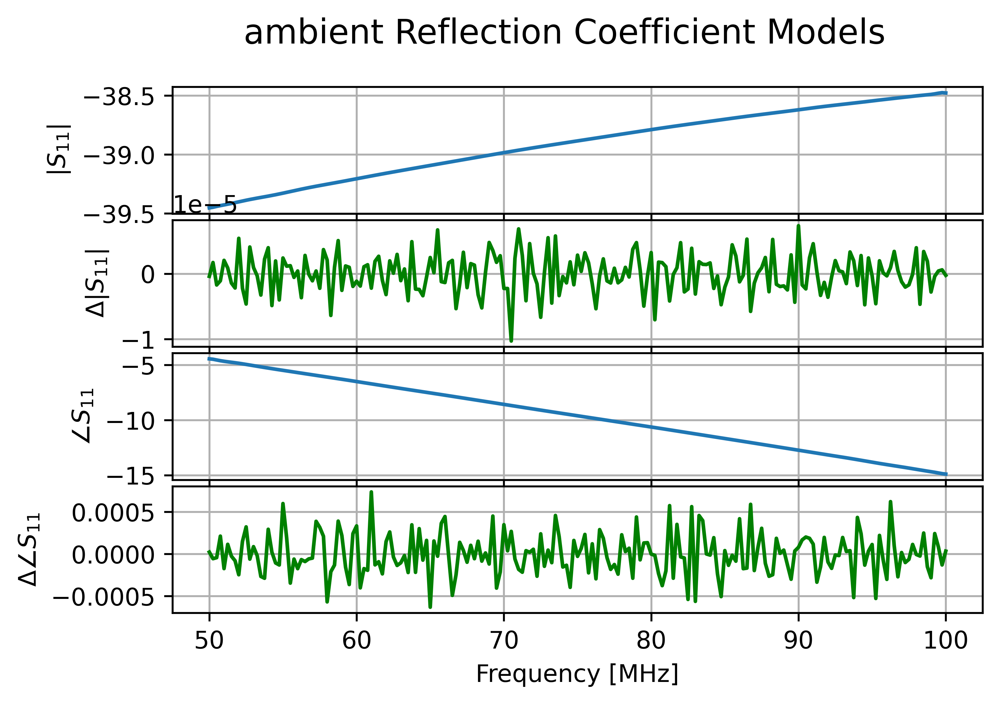

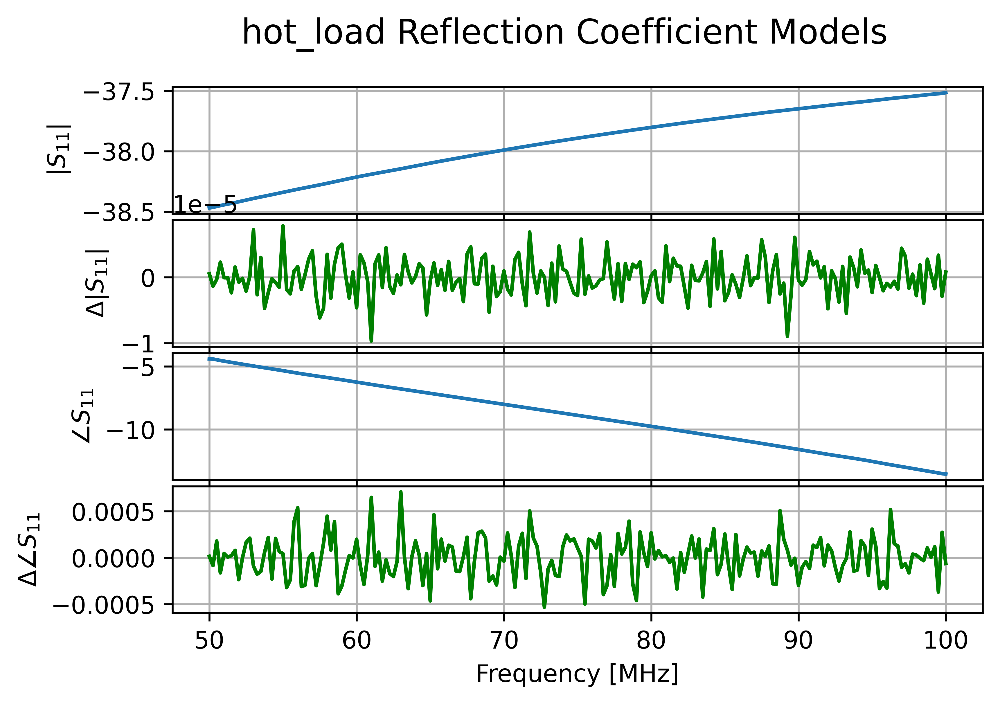

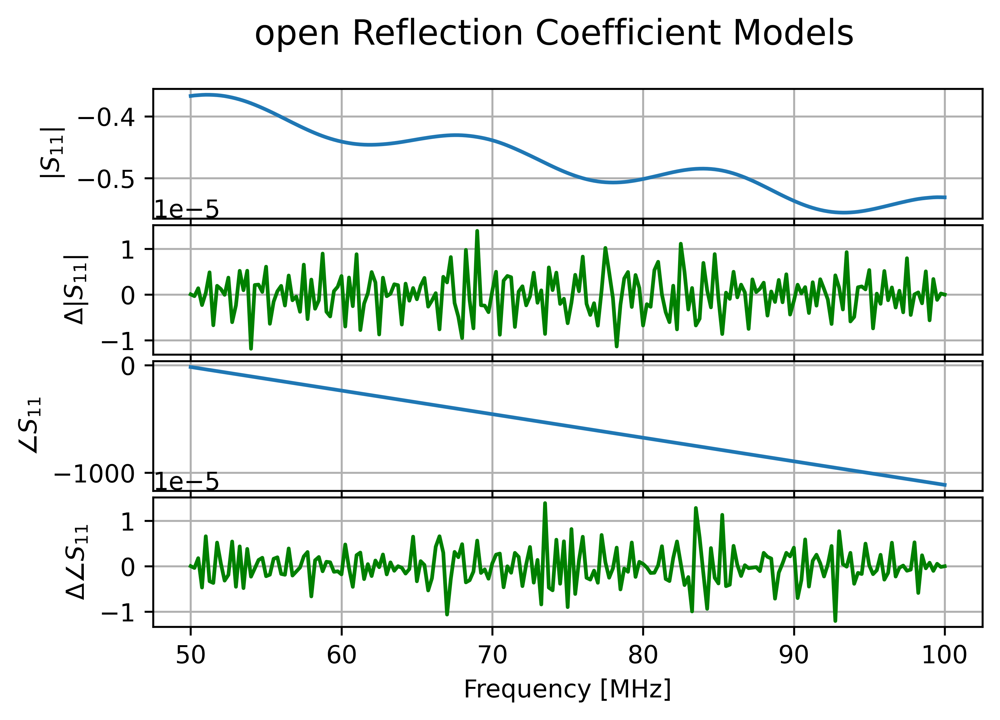

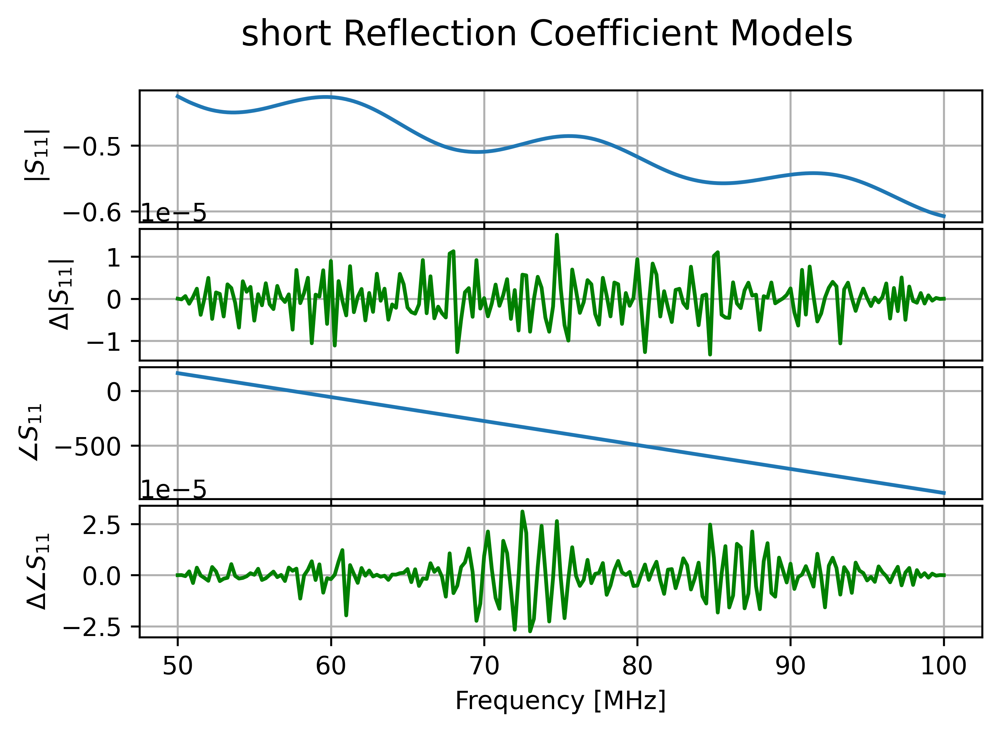

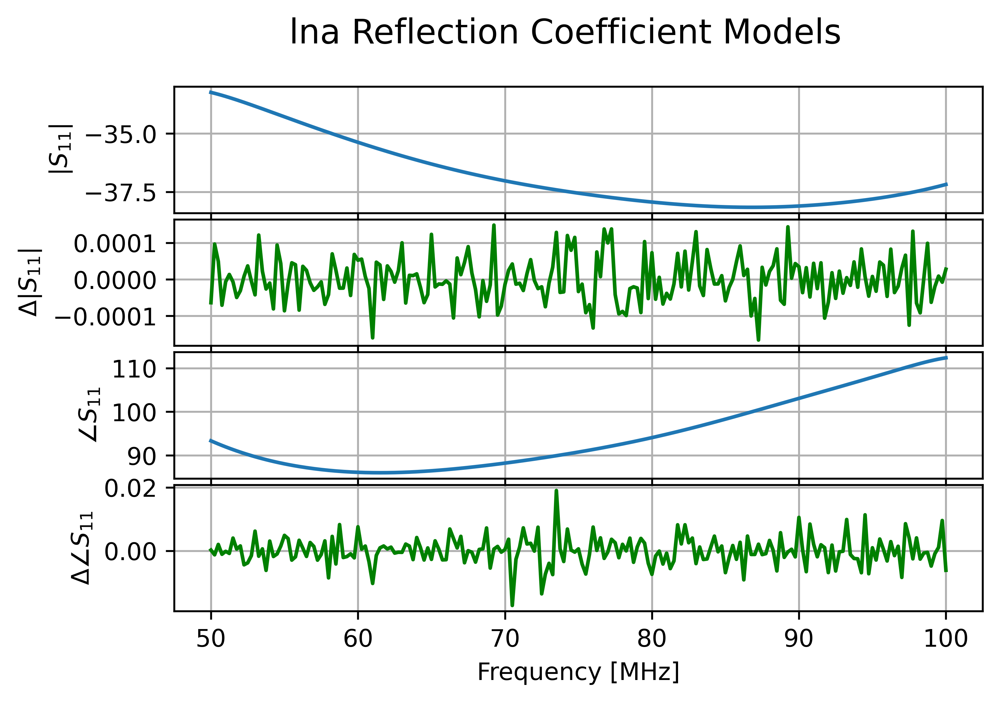

In [100]:
utils.calobs.plot_s11_models()

Text(0.5, 0, 'Delay [microsec]')

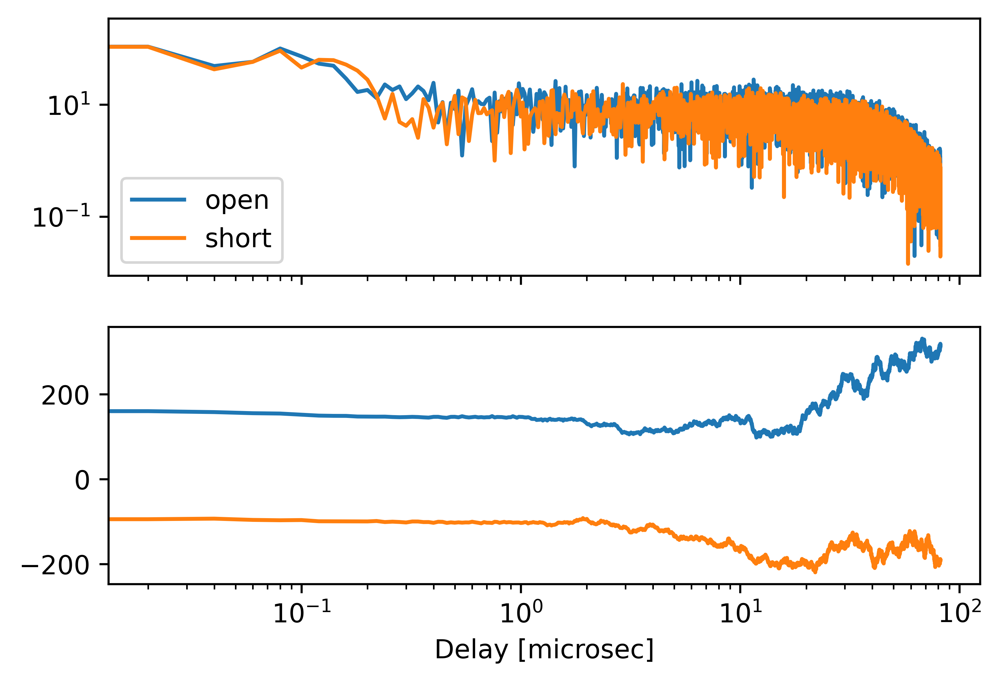

In [87]:
resid = utils.calobs.decalibrate(utils.calobs.open.spectrum.temp_ave, 'open') - utils.calobs.open.spectrum.averaged_spectrum

fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(resid))), label='open')
ax[1].plot(freq, np.unwrap(np.angle((np.fft.fftshift(np.fft.fft(resid))))))

resid = utils.calobs.decalibrate(utils.calobs.short.spectrum.temp_ave, 'short') - utils.calobs.short.spectrum.averaged_spectrum

ax[0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(resid))), label='short')
ax[1].plot(freq, np.unwrap(np.angle((np.fft.fftshift(np.fft.fft(resid))))))

ax[0].legend()
ax[0].set_yscale('log')
ax[0].set_xscale('log')
ax[-1].set_xlabel("Delay [microsec]")

Text(0.5, 0, 'Delay [microsec]')

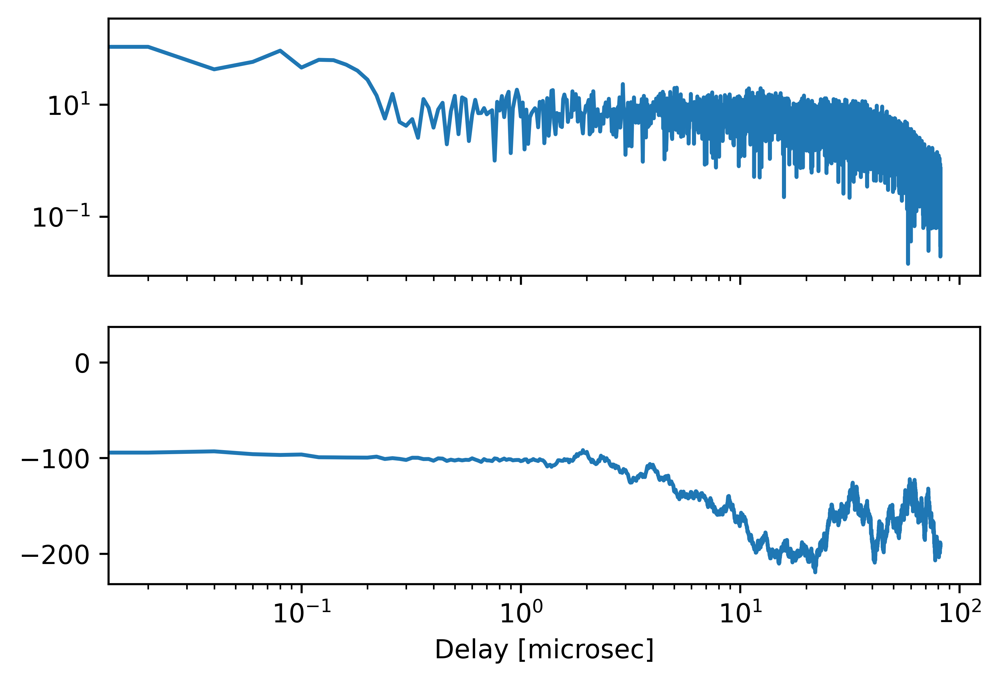

In [85]:
resid = utils.calobs.decalibrate(utils.calobs.short.spectrum.temp_ave, 'short') - utils.calobs.short.spectrum.averaged_spectrum

fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(freq, np.abs(np.fft.fftshift(np.fft.fft(resid))), label='solution')
ax[1].plot(freq, np.unwrap(np.angle((np.fft.fftshift(np.fft.fft(resid))))), label='solution')
ax[0].set_yscale('log')
ax[0].set_xscale('log')
ax[-1].set_xlabel("Delay [microsec]")

## Are losses in the long cable causing the discrepancy?

One possible cause of concern are ambient temperature fluctuations that cause a temperature gradient along the long cable, causing loss which is unaccounted for. Here, we won't try to model this loss directly, but instead, we look at the temperature fluctuations and see if we can empirically determine if they're causing differences.

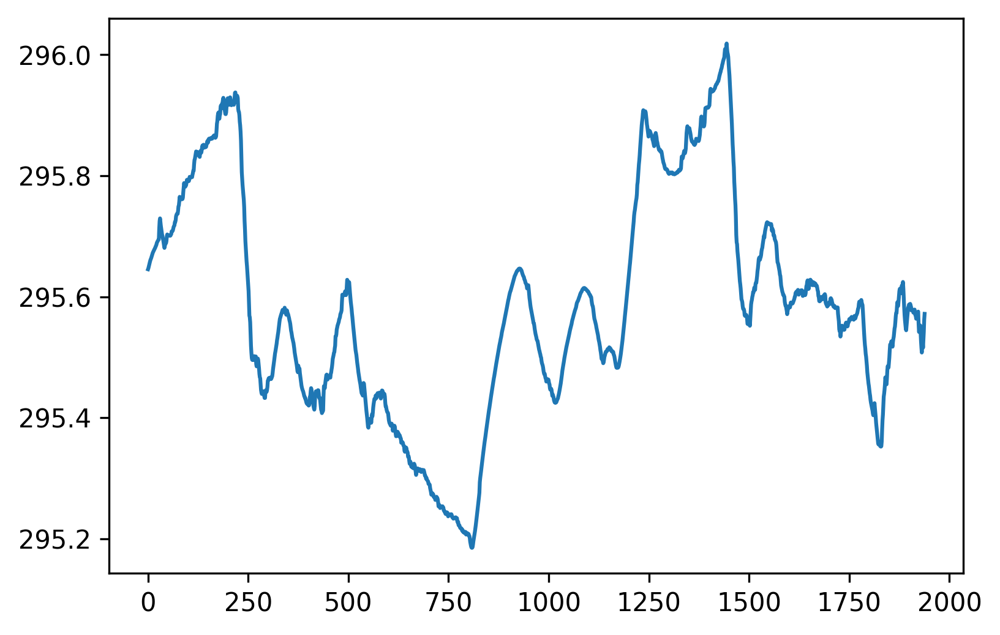

In [34]:
plt.plot(utils.calobs.open.spectrum.thermistor_temp)
plt.savefig("plots/open_cable_temps.pdf")

In [16]:
from datetime import timedelta

In [24]:
closest = []
indx = 0
closest
deltat = utils.calobs.open.spectrum.thermistor_timestamps[1] - utils.calobs.open.spectrum.thermistor_timestamps[0]

for d in utils.calobs.open.spectrum.spectrum_timestamps:
    for td in utils.calobs.open.spectrum.thermistor_timestamps[indx:]:
        if d - td > timedelta(0) and d - td <= deltat:
            closest.append(td)
            break
        if d - td > timedelta(0):
            indx += 1
        

In [28]:
temp_closest = np.array([utils.calobs.open.spectrum.thermistor_temp[utils.calobs.open.spectrum.thermistor_timestamps.index(c)] for c in closest])

Are there correlations between temperature and spectra?

In [9]:
spec = utils.calobs.open.spectrum.get_spectra()

In [36]:
R = []
for q in spec['Q']:
    R.append(np.corrcoef(temp_closest, q[:len(temp_closest)])[0,1])

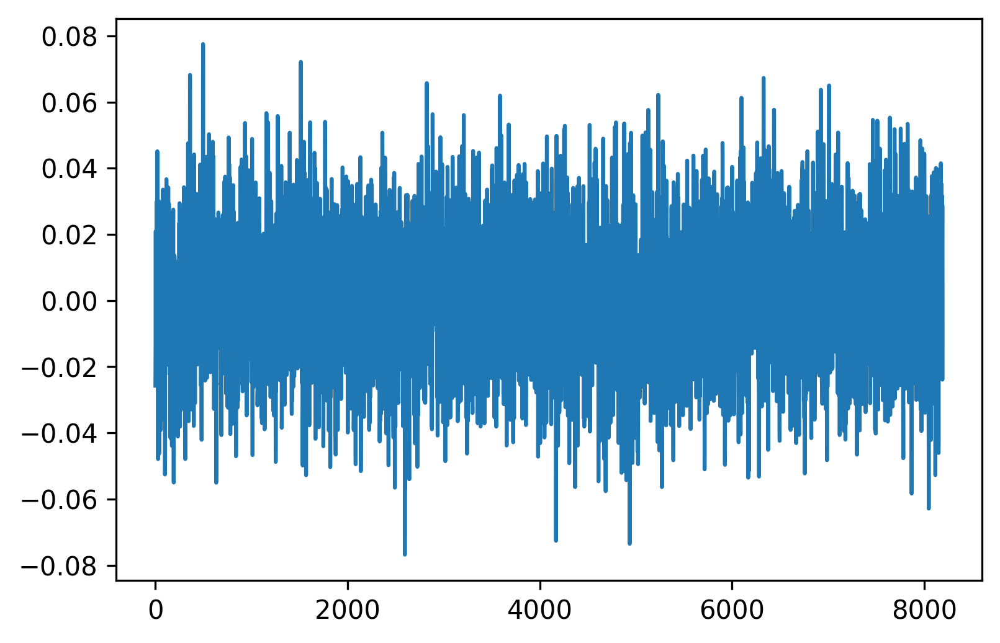

In [38]:
plt.plot(R)

Doesn't look like it, but this wouldn't necessarily capture if there are ripples through the data. For that we'll have to do a more coarse-grained analysis of the total calibration.

In [3]:
lower = utils.get_calobs(open_temp_range=(295.2, 295.5), smooth=16, wterms=8)

In [4]:
total = utils.get_calobs(smooth=16, wterms=8)

In [5]:
upper = utils.get_calobs(open_temp_range=(295.5, 296), smooth=16, wterms=8)

/tmp/ipykernel_43216/450597721.py:4: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


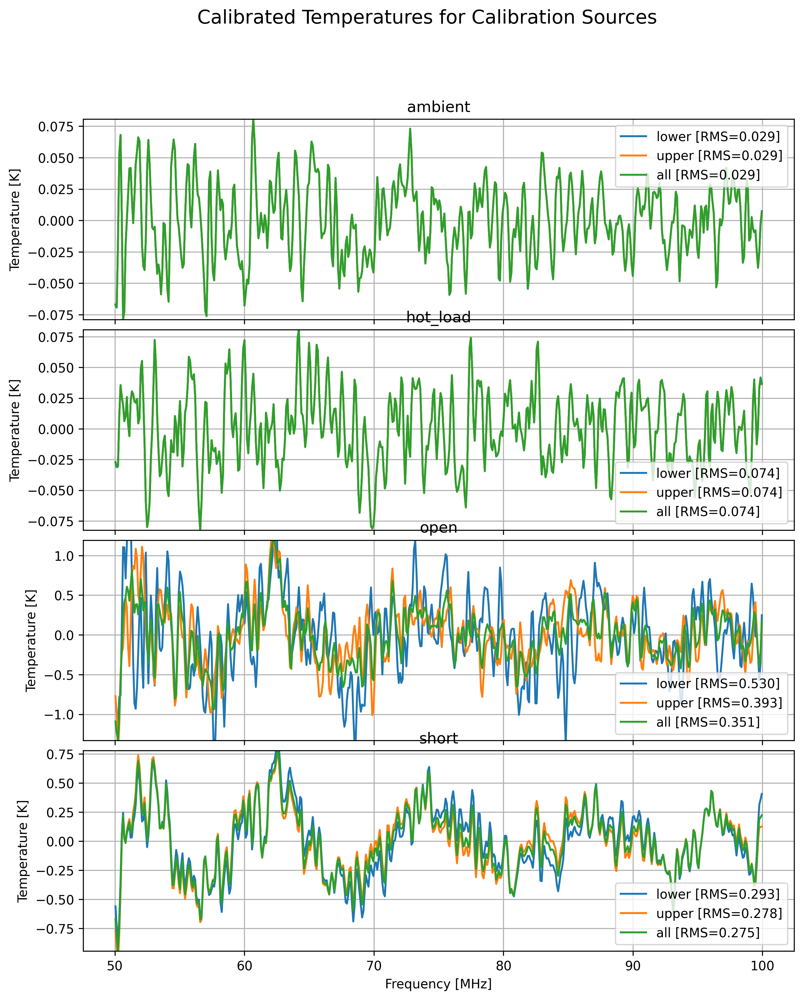

In [7]:
fig = lower.plot_calibrated_temps(bins=1, as_residuals=True, load_in_title=True, label='lower')
upper.plot_calibrated_temps(bins=1, fig=fig, ax=fig.axes, as_residuals=True, load_in_title=True, label='upper')
total.plot_calibrated_temps(bins=1, fig=fig, ax=fig.axes, as_residuals=True, load_in_title=True, label='all');
plt.tight_layout()
plt.savefig("plots/effect_of_temperature.pdf")

## What is the sensitivity to the resistance(s)?

In [9]:
obs.internal_switch.resistance

50.12

50.0
50.05
50.1
50.2
50.3


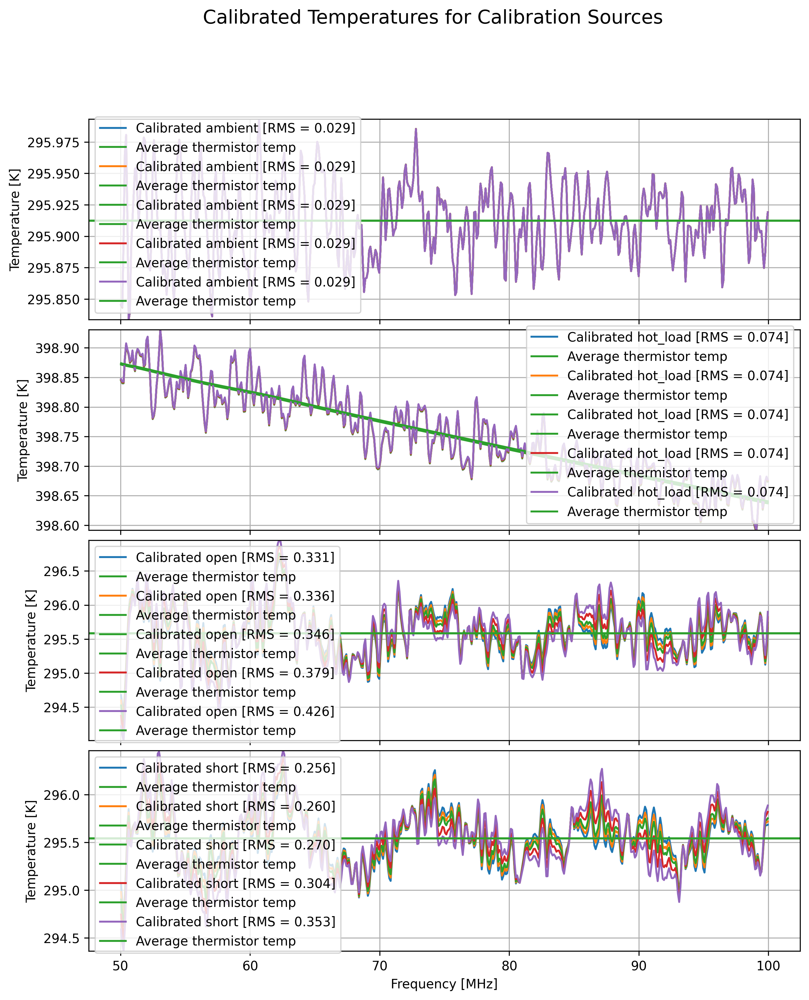

In [3]:
fig = None

for resistance_m in [50.0, 50.05, 50.1, 50.2, 50.3]:
    obs = utils.get_calobs(cterms=6, wterms=8, smooth=16, internal_switch_kwargs={'resistance': resistance_m})
    print(obs.internal_switch.resistance)
    fig = obs.plot_calibrated_temps(fig=fig, ax=fig.axes if fig is not None else None, bins=1)

49.8
49.9
50
50.1
50.2


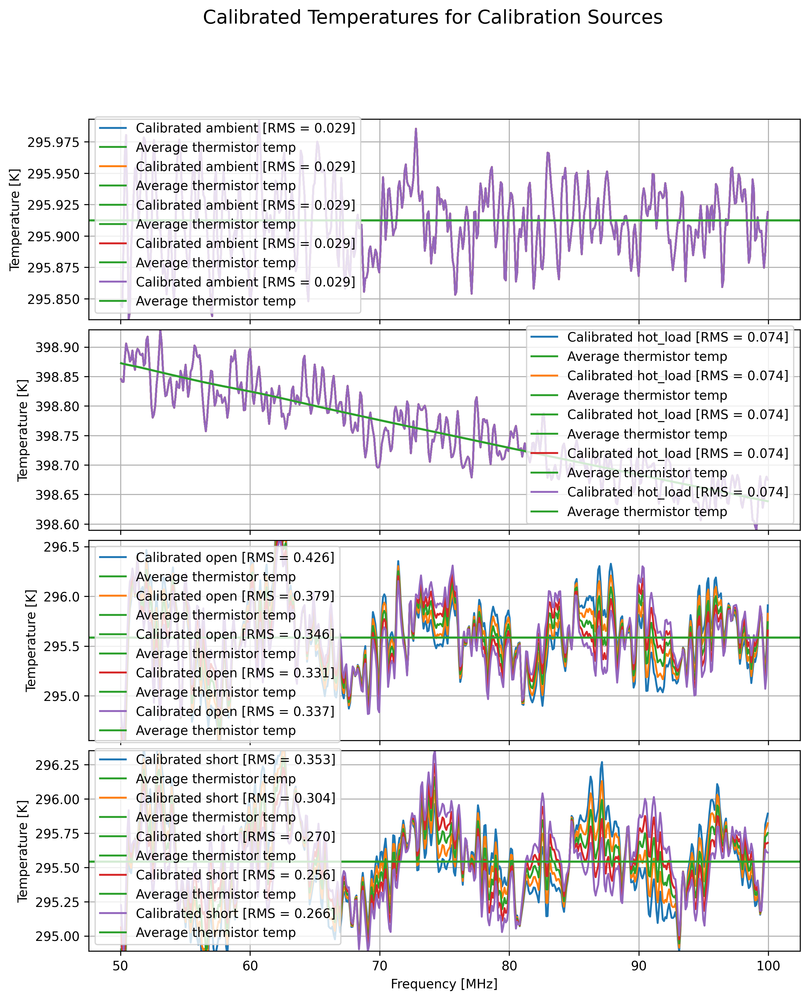

In [6]:
fig = None

for resistance_m in [49.8, 49.9, 50, 50.1, 50.2]:
    obs = utils.get_calobs(cterms=6, wterms=8, smooth=16, resistance_f=resistance_m)
    print(obs.lna.resistance)
    fig = obs.plot_calibrated_temps(fig=fig, ax=fig.axes if fig is not None else None, bins=1)